## Importation les classes nécessaires

In [1]:
import psycopg2 as pg
from configparser import ConfigParser
import pandas as pd 
import geopandas as gpd
import numpy as np
from shapely import wkb, wkt
import warnings
warnings.filterwarnings('ignore')


import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from kneed import KneeLocator # sert à détecter l'hyper-parametre K pour la méthode KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

from sklearn.metrics import silhouette_score


## La connection avec la base de donnnes

In [2]:
def config(filename='database.ini', section='postgresql'):
    parser = ConfigParser()
    parser.read(filename)

    db = {}
    if parser.has_section(section):
        params = parser.items(section)
        for param in params:
            db[param[0]] = param[1]

    else:
        raise Exception('section {0} not found in the {1} file'.format(section, filename))

    return db

## Chargement des données

In [3]:
def connect(table):
    """ Connect to the PostgreSQL database server """
    conn = None 
    try:
        # Read connection parameters
        params = config()

        # Connect to the PostgreSQL server
        print("Looding the data  ...")
        conn = pg.connect(**params)

        # Create dataframe
        lines_in_cites = pd.read_sql('SELECT * FROM osm.lines_in_'+str(table)+';', conn)
        print("Lines table has been loaded")

        line_length_in_cites = pd.read_sql('SELECT * FROM osm.lines_lenght_in_'+str(table)+';', conn )
        print("Length of lines table has been loaded")

        tags_in_cites = pd.read_sql('SELECT * FROM osm.tags_in_'+str(table)+';', conn )
        print("Tags table has been loaded")

    except (Exception, pg.DatabaseError) as error:
        print(error)

    finally:
        if conn is not None:
            conn.close()
            print('Database connection closed.')
            return lines_in_cites, line_length_in_cites, tags_in_cites


In [4]:
lines_in_cites, line_length_in_cites, tags_in_cites = connect("cites")

Looding the data  ...
Lines table has been loaded
Length of lines table has been loaded
Tags table has been loaded
Database connection closed.


### Lines in cites

In [5]:
lines_in_cites.head()

,id,city_osm_id,line_osm_id,city_name,line_type,line_surface,line_tags
0,1,-1708912,541532981,عمالة الرباط,trunk,None,"""lanes""=>""2"", ""int_ref""=>""TAH 1"", ""name:ar""=>""..."
1,2,-1708912,625688181,عمالة الرباط,primary,None,"""name:ar""=>""Rocade de Rabat الطريق السيار المد..."
2,3,-1708912,1011955706,عمالة الرباط,service,None,"""osm_uid""=>""0"", ""osm_user""=>"""", ""osm_version""=..."
3,4,-1708912,1011955705,عمالة الرباط,service,None,"""osm_uid""=>""0"", ""osm_user""=>"""", ""osm_version""=..."
4,5,-1708912,249631233,عمالة الرباط,residential,asphalt,"""osm_uid""=>""0"", ""osm_user""=>"""", ""osm_version""=..."


In [6]:
lines_in_cites.shape

(715053, 7)

In [7]:
lines_in_cites.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 715053 entries, 0 to 715052
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            715053 non-null  int64 
 1   city_osm_id   715053 non-null  int64 
 2   line_osm_id   715053 non-null  int64 
 3   city_name     715053 non-null  object
 4   line_type     715053 non-null  object
 5   line_surface  186139 non-null  object
 6   line_tags     715053 non-null  object
dtypes: int64(3), object(4)
memory usage: 38.2+ MB


### Length of roads in every cites

In [8]:
line_length_in_cites.head()

,id,city_osm_id,city_name,highway,way_length
0,1,-1708912,عمالة الرباط,bridleway,2.352716
1,2,-1708912,عمالة الرباط,construction,4.129194
2,3,-1708912,عمالة الرباط,crossing,0.017031
3,4,-1708912,عمالة الرباط,cycleway,5.920256
4,5,-1708912,عمالة الرباط,footway,122.706170


In [9]:
line_length_in_cites.shape

(1318, 5)

In [10]:
line_length_in_cites.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1318 entries, 0 to 1317
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           1318 non-null   int64  
 1   city_osm_id  1318 non-null   int64  
 2   city_name    1318 non-null   object 
 3   highway      1318 non-null   object 
 4   way_length   1318 non-null   float64
dtypes: float64(1), int64(2), object(2)
memory usage: 51.6+ KB


### Obstacles in every city

In [11]:
tags_in_cites.drop(["city_name"], axis=1).head()

,id,city_osm_id,junction,tunnel,bridge,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle,turning_loop,city_population,city_geom
0,1,-1708912,168,36,32,6,861.0,4.0,NaN,NaN,370.0,126.0,2.0,577827,0106000020110F00000400000001030000000100000074...
1,2,-2523535,194,40,87,41,102.0,NaN,17.0,2.0,1.0,27.0,1.0,333604,0103000020110F0000010000000602000093942E61F3C5...
2,3,-1712779,32,48,106,5,40.0,1.0,NaN,NaN,NaN,18.0,NaN,450527,0106000020110F0000220000000103000000010000002C...
3,4,-3406822,23,3,1,0,141.0,NaN,NaN,140.0,20.0,NaN,NaN,126765,0103000020110F000001000000EA2D00007BC042E04EF7...
4,5,-1709089,36,10,93,0,122.0,1.0,NaN,NaN,NaN,9.0,NaN,155221,0103000020110F0000010000000F010000B1EE35700640...


In [12]:
tags_in_cites.shape

(75, 16)

In [13]:
tags_in_cites.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75 entries, 0 to 74
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 75 non-null     int64  
 1   city_osm_id        75 non-null     int64  
 2   city_name          75 non-null     object 
 3   junction           75 non-null     int64  
 4   tunnel             75 non-null     int64  
 5   bridge             75 non-null     int64  
 6   traffic_calming    75 non-null     int64  
 7   crossing           68 non-null     float64
 8   mini_roundabout    34 non-null     float64
 9   motorway_junction  34 non-null     float64
 10  stop               34 non-null     float64
 11  traffic_signals    37 non-null     float64
 12  turning_circle     66 non-null     float64
 13  turning_loop       12 non-null     float64
 14  city_population    75 non-null     object 
 15  city_geom          75 non-null     object 
dtypes: float64(7), int64(6), obj

In [14]:
tags_in_cites.describe()

,id,city_osm_id,junction,tunnel,bridge,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle,turning_loop
count,75.000000,7.500000e+01,75.000000,75.000000,75.000000,75.000000,68.000000,34.000000,34.000000,34.000000,37.000000,66.000000,12.000000
mean,38.000000,-2.343808e+06,92.533333,40.800000,139.346667,12.626667,161.735294,1.705882,7.529412,16.911765,68.243243,14.666667,1.750000
std,21.794495,7.524579e+05,133.166664,39.295141,94.553930,31.296651,383.825622,1.168511,4.875637,36.202601,143.935056,26.844471,1.422226
min,1.000000,-3.681825e+06,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000
25%,19.500000,-2.535038e+06,19.000000,15.000000,72.500000,0.000000,7.000000,1.000000,4.000000,3.000000,4.000000,2.000000,1.000000
50%,38.000000,-1.720162e+06,37.000000,30.000000,135.000000,0.000000,32.000000,1.000000,7.000000,6.500000,20.000000,4.000000,1.000000
75%,56.500000,-1.709096e+06,122.500000,48.500000,187.500000,7.500000,132.250000,2.000000,9.750000,14.750000,61.000000,14.000000,2.000000
max,75.000000,-1.707940e+06,849.000000,172.000000,474.000000,192.000000,2569.000000,6.000000,23.000000,173.000000,801.000000,129.000000,6.000000


### Merging line table with length of lines tables

In [15]:
def transform_tag(a):
    d={}
    key = ''
    for i in a.replace('"','').split(','):
        key = i.lstrip().split("=>")[0]
        if key == 'lanes' or key == 'maxspeed':
            d[key] =  int(i.split("=>")[1].split(" ")[0])

    return d

In [16]:
lines_in_cites.line_tags = lines_in_cites.line_tags.apply(transform_tag)
lines_in_cites.drop(["city_name"], axis=1)

,id,city_osm_id,line_osm_id,line_type,line_surface,line_tags
0,1,-1708912,541532981,trunk,None,"{'lanes': 2, 'maxspeed': 80}"
1,2,-1708912,625688181,primary,None,{'maxspeed': 60}
2,3,-1708912,1011955706,service,None,{}
3,4,-1708912,1011955705,service,None,{}
4,5,-1708912,249631233,residential,asphalt,{}
...,...,...,...,...,...,...
715048,715049,-1712795,713408702,path,None,{}
715049,715050,-1712795,713408721,path,None,{}
715050,715051,-1712795,713408701,path,None,{}
715051,715052,-1712795,713408730,path,None,{}


In [17]:
lines_in_cites = lines_in_cites.join(pd.json_normalize(lines_in_cites.line_tags))

In [18]:
lines_in_cites.drop(["line_tags", "line_osm_id"], axis=1, inplace = True)

In [19]:
lines_in_cites.head()

,id,city_osm_id,city_name,line_type,line_surface,lanes,maxspeed
0,1,-1708912,عمالة الرباط,trunk,None,2.0,80.0
1,2,-1708912,عمالة الرباط,primary,None,NaN,60.0
2,3,-1708912,عمالة الرباط,service,None,NaN,NaN
3,4,-1708912,عمالة الرباط,service,None,NaN,NaN
4,5,-1708912,عمالة الرباط,residential,asphalt,NaN,NaN


In [20]:
lines_in_cites.drop(lines_in_cites[(lines_in_cites.line_type == "path") | (lines_in_cites.line_type == "pedestrian") | (lines_in_cites.line_type == "step") | (lines_in_cites.line_type == "steps") | (lines_in_cites.line_type == "track") | (lines_in_cites.line_type == "unclassified") | (lines_in_cites.line_type == "road") | (lines_in_cites.line_type == "rest_area") | (lines_in_cites.line_type == "corridor") | (lines_in_cites.line_type == "bus_guideway") | (lines_in_cites.line_type == "platform") | (lines_in_cites.line_type == "pedestrian") | (lines_in_cites.line_type == "crossing") | (lines_in_cites.line_type == "bridleway") | (lines_in_cites.line_type == "proposed") | (lines_in_cites.line_type == "construction") |  (lines_in_cites.line_type == "escape") | (lines_in_cites.line_type == "raceway") |  (lines_in_cites.line_type == "cycleway") | (lines_in_cites.line_type == "service") | (lines_in_cites.line_type == "services") ].index, inplace=True)

In [21]:
list(set(lines_in_cites.line_type))

['living_street',
 'trunk',
 'residential',
 'secondary',
 'motorway',
 'secondary_link',
 'tertiary',
 'footway',
 'tertiary_link',
 'primary_link',
 'primary',
 'motorway_link',
 'trunk_link']

In [22]:
lines_in_cites.shape

(323207, 7)

In [23]:
lines_in_cites_groupedby_speed_lanes = lines_in_cites.groupby(["city_osm_id","city_name","line_type"])[["maxspeed","lanes"]].median().reset_index()

In [24]:
lines_in_cites_groupedby_speed_lanes

,city_osm_id,city_name,line_type,maxspeed,lanes
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,NaN,NaN
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,NaN,NaN
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120.0,2.0
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60.0,1.0
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40.0,2.0
...,...,...,...,...,...
770,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,secondary_link,40.0,2.0
771,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary,60.0,2.0
772,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary_link,NaN,1.0
773,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,trunk,60.0,2.0


In [25]:
list(set(lines_in_cites.line_surface))

['gravel',
 'cx',
 'paving_stones',
 'cobblestone',
 'grass',
 '1',
 'wood',
 'cement',
 'pavés',
 'pas',
 'sand',
 'dirt',
 'asphalt',
 'unpaved33',
 'metal',
 'dirt/sand',
 'ground',
 'unpaved',
 'earth',
 'mud',
 'compacted',
 None,
 'piste',
 'paved',
 'fine_gravel',
 'route',
 'sett',
 'concrete',
 'Attention_en_cas_de_forte_pluie_assage_à_gué']

In [26]:
lines_in_cites[lines_in_cites.city_osm_id ==-5921806]

,id,city_osm_id,city_name,line_type,line_surface,lanes,maxspeed


In [27]:
from scipy import stats
# mode = lambda x: x.mode() if len(x)  > 2  else np.array(x)[0]

# lines_in_cites_groupedby_surface = lines_in_cites.groupby(["city_osm_id","line_type"]).agg(lambda x: stats.mode(x.line_surface)[0])

In [28]:
lines_in_cites_groupedby_surface = lines_in_cites.groupby(["city_osm_id","line_type"])["line_surface"].agg(lambda x: x.mode(dropna=False).iloc[0]).to_frame().reset_index()

In [29]:
lines_in_cites_groupedby_surface

,city_osm_id,line_type,line_surface
0,-3681825,footway,None
1,-3681825,living_street,paving_stones
2,-3681825,motorway,asphalt
3,-3681825,motorway_link,asphalt
4,-3681825,primary,asphalt
...,...,...,...
770,-1707940,secondary_link,asphalt
771,-1707940,tertiary,asphalt
772,-1707940,tertiary_link,None
773,-1707940,trunk,asphalt


In [30]:
lines_in_cites_groupedby_speed_lanes

,city_osm_id,city_name,line_type,maxspeed,lanes
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,NaN,NaN
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,NaN,NaN
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120.0,2.0
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60.0,1.0
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40.0,2.0
...,...,...,...,...,...
770,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,secondary_link,40.0,2.0
771,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary,60.0,2.0
772,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary_link,NaN,1.0
773,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,trunk,60.0,2.0


In [31]:
lines_in_cites_groupedby_surface.head(13)

,city_osm_id,line_type,line_surface
0,-3681825,footway,None
1,-3681825,living_street,paving_stones
2,-3681825,motorway,asphalt
3,-3681825,motorway_link,asphalt
4,-3681825,primary,asphalt
5,-3681825,primary_link,asphalt
6,-3681825,residential,None
7,-3681825,secondary,asphalt
8,-3681825,secondary_link,None
9,-3681825,tertiary,asphalt


In [32]:
type_speed_with_surface = lines_in_cites_groupedby_speed_lanes.merge(lines_in_cites_groupedby_surface, on=["city_osm_id", "line_type"], how = 'inner')
lines_df = type_speed_with_surface.merge(line_length_in_cites, right_on=["city_osm_id", "highway"], left_on=["city_osm_id", "line_type"], how='inner')
lines_df.drop(["id", "city_name_y" , "highway"], axis=1, inplace=True)

In [33]:
lines_df.head(13)

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,NaN,NaN,None,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,NaN,NaN,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120.0,2.0,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60.0,1.0,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40.0,2.0,asphalt,89.813063
5,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary_link,40.0,2.0,asphalt,0.290612
6,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,residential,40.0,2.0,None,511.391616
7,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary,60.0,2.0,asphalt,18.732061
8,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary_link,NaN,NaN,None,0.055087
9,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,tertiary,50.0,2.0,asphalt,31.841100


In [34]:
lines_df["maxspeed"].loc[(lines_df.line_type == 'footway') |(lines_df.line_type == 'living_street' ) ] = 20
lines_df["lanes"].loc[(lines_df.line_type == 'footway') | (lines_df.line_type == 'living_street' ) ] = 1

In [35]:
lines_df.head(13)

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,20.0,1.0,None,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,20.0,1.0,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120.0,2.0,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60.0,1.0,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40.0,2.0,asphalt,89.813063
5,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary_link,40.0,2.0,asphalt,0.290612
6,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,residential,40.0,2.0,None,511.391616
7,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary,60.0,2.0,asphalt,18.732061
8,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary_link,NaN,NaN,None,0.055087
9,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,tertiary,50.0,2.0,asphalt,31.841100


In [36]:
for col in lines_df[["maxspeed", "lanes"]]:
    imputer = KNNImputer(missing_values = np.nan, n_neighbors = 5)
    lines_df[col] = [round(i[0]) for i in imputer.fit_transform(lines_df[col].values.reshape(-1, 1))]

In [37]:
lines_df.head(13)

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,20,1,None,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,20,1,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120,2,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60,1,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40,2,asphalt,89.813063
5,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary_link,40,2,asphalt,0.290612
6,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,residential,40,2,None,511.391616
7,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary,60,2,asphalt,18.732061
8,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary_link,53,2,None,0.055087
9,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,tertiary,50,2,asphalt,31.841100


In [38]:
lines_df.line_surface = lines_df.line_surface.astype('str')
lines_df["line_surface"].loc[(lines_df.line_surface == '[]') | (lines_df.line_surface == 'None')] = "undefined"

In [39]:
lines_df.head(13)

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,20,1,undefined,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,20,1,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120,2,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60,1,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40,2,asphalt,89.813063
5,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary_link,40,2,asphalt,0.290612
6,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,residential,40,2,undefined,511.391616
7,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary,60,2,asphalt,18.732061
8,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary_link,53,2,undefined,0.055087
9,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,tertiary,50,2,asphalt,31.841100


In [40]:
lines_df["line_surface"].loc[(lines_df.line_surface == "['asphalt' 'paved']") | (lines_df.line_surface == "['asphalt' 'unpaved']") | (lines_df.line_surface == "['asphalt' 'paved' 'unpaved']") ] = "mixed"

In [41]:
lines_df.head(13)

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,20,1,undefined,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,20,1,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120,2,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60,1,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40,2,asphalt,89.813063
5,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary_link,40,2,asphalt,0.290612
6,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,residential,40,2,undefined,511.391616
7,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary,60,2,asphalt,18.732061
8,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,secondary_link,53,2,undefined,0.055087
9,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,tertiary,50,2,asphalt,31.841100


In [42]:
lines_df.isna().mean()*100

city_osm_id     0.0
city_name_x     0.0
line_type       0.0
maxspeed        0.0
lanes           0.0
line_surface    0.0
way_length      0.0
dtype: float64

In [43]:
lines_df

,city_osm_id,city_name_x,line_type,maxspeed,lanes,line_surface,way_length
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,footway,20,1,undefined,73.181582
1,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,living_street,20,1,paving_stones,28.269322
2,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway,120,2,asphalt,40.012925
3,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,motorway_link,60,1,asphalt,10.866884
4,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,primary,40,2,asphalt,89.813063
...,...,...,...,...,...,...,...
770,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,secondary_link,40,2,asphalt,1.682961
771,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary,60,2,asphalt,438.342053
772,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,tertiary_link,53,1,undefined,0.912532
773,-1707940,Préfecture de Tanger-Assilah عمالة طنجة-أصيلة,trunk,60,2,asphalt,115.768746


In [44]:
lines_df = lines_df.set_index(["city_osm_id", "city_name_x", "line_type"]).unstack(2)

In [45]:
lines_df = lines_df.set_axis(lines_df.columns.map('_'.join), axis = 1, inplace = False).reset_index()
lines_df

,city_osm_id,city_name_x,maxspeed_footway,maxspeed_living_street,maxspeed_motorway,maxspeed_motorway_link,maxspeed_primary,maxspeed_primary_link,maxspeed_residential,maxspeed_secondary,...,way_length_motorway_link,way_length_primary,way_length_primary_link,way_length_residential,way_length_secondary,way_length_secondary_link,way_length_tertiary,way_length_tertiary_link,way_length_trunk,way_length_trunk_link
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,20.0,20.0,120.0,60.0,40.0,40.0,40.0,60.0,...,10.866884,89.813063,0.290612,511.391616,18.732061,0.055087,31.841100,0.022407,76.165481,0.157790
1,-3676456,Province de Sidi Ifni ⵜⴰⵙⴳⴰ ⵏ ⵙⵉⴷⵉ ⵉⴼⵏⵉ إقليم ...,20.0,20.0,NaN,NaN,60.0,53.0,60.0,60.0,...,NaN,90.371250,0.085323,156.754633,74.587100,0.237882,669.455572,0.110385,NaN,NaN
2,-3676245,Province de Midelt إقليم ميدلت,20.0,20.0,NaN,NaN,60.0,80.0,40.0,60.0,...,NaN,474.162948,0.293251,415.401192,205.689059,NaN,1315.544813,0.038593,NaN,NaN
3,-3672143,Province de Tinghir إقليم تنغير,20.0,20.0,NaN,NaN,60.0,53.0,53.0,60.0,...,NaN,588.455332,0.261279,869.045812,151.756579,NaN,667.189485,0.018549,NaN,NaN
4,-3671533,Province de Rhamna إقليم الرحامنة,20.0,20.0,120.0,40.0,80.0,60.0,53.0,60.0,...,14.913348,151.431133,0.325786,240.246043,62.466700,0.594554,723.561290,0.298496,0.912564,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,-1708835,Province de Kenitra إقليم القنيطرة,20.0,20.0,120.0,40.0,60.0,40.0,40.0,60.0,...,22.632783,277.391489,1.131040,1572.994277,24.723254,0.297260,1521.297535,2.275259,71.199925,0.624103
71,-1708828,Province de Chefchaouen ⵜⵛⴻⴼⵜⵛⴰⵡⴻⵏ إقليم شفشاون,20.0,20.0,NaN,NaN,60.0,53.0,53.0,60.0,...,NaN,373.938776,0.166710,128.688501,184.286075,0.017816,378.415277,NaN,10.001147,0.014540
72,-1708821,Province de Larache إقليم العرائش,20.0,20.0,120.0,60.0,60.0,60.0,20.0,60.0,...,9.881486,142.939198,0.516805,602.476142,124.374691,0.731681,486.900558,0.065629,89.684875,0.726842
73,-1707958,Province de Tétouan إقليم تطوان,20.0,20.0,120.0,60.0,60.0,50.0,60.0,60.0,...,4.779461,282.042189,0.542551,758.495417,70.235057,0.094620,162.640231,0.166139,136.731351,4.240791


In [46]:
nan_not_accepted = list(lines_df.drop(["city_osm_id","city_name_x"], axis=1).columns)
nan_not_accepted_in_non_category = [i for i in nan_not_accepted if i[:12] != "line_surface"]
nan_not_accepted_in_category = [i for i in nan_not_accepted if i[:12] == "line_surface"]

In [47]:
for column in nan_not_accepted_in_non_category:
    lines_df[column] = lines_df[column].replace(np.NaN, 0)

for column in nan_not_accepted_in_category:
    lines_df[column] = lines_df[column].replace(np.NaN, "inexistent")

In [48]:
lines_df.isna().mean()*100

city_osm_id                    0.0
city_name_x                    0.0
maxspeed_footway               0.0
maxspeed_living_street         0.0
maxspeed_motorway              0.0
maxspeed_motorway_link         0.0
maxspeed_primary               0.0
maxspeed_primary_link          0.0
maxspeed_residential           0.0
maxspeed_secondary             0.0
maxspeed_secondary_link        0.0
maxspeed_tertiary              0.0
maxspeed_tertiary_link         0.0
maxspeed_trunk                 0.0
maxspeed_trunk_link            0.0
lanes_footway                  0.0
lanes_living_street            0.0
lanes_motorway                 0.0
lanes_motorway_link            0.0
lanes_primary                  0.0
lanes_primary_link             0.0
lanes_residential              0.0
lanes_secondary                0.0
lanes_secondary_link           0.0
lanes_tertiary                 0.0
lanes_tertiary_link            0.0
lanes_trunk                    0.0
lanes_trunk_link               0.0
line_surface_footway

In [49]:
def convert(row_geo):
    return wkb.loads(row_geo, hex= True)

In [50]:
tags_in_cites.city_geom = tags_in_cites.city_geom.apply(convert)
# tags_in_cites.city_geom = tags_in_cites.city_geom.apply(wkt.loads)

In [51]:
# mylisttodelet = ['traffic_calming', 'traffic_signals', 'junction']
# mylisttodelet.extend(["city_osm_id","city_population", "city_geom"])

In [52]:
# tags_in_cites.drop(tags_in_cites.columns.difference(mylisttodelet), 1)

In [53]:
lines_df = lines_df.merge(tags_in_cites.drop(["city_name"], axis=1), right_on="city_osm_id", left_on="city_osm_id", how='inner')
lines_df.drop(["id"], axis=1, inplace = True)

In [54]:
cites_df = lines_df.copy()
cites_df

,city_osm_id,city_name_x,maxspeed_footway,maxspeed_living_street,maxspeed_motorway,maxspeed_motorway_link,maxspeed_primary,maxspeed_primary_link,maxspeed_residential,maxspeed_secondary,...,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle,turning_loop,city_population,city_geom
0,-3681825,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,20.0,20.0,120.0,60.0,40.0,40.0,40.0,60.0,...,43,228.0,2.0,4.0,NaN,1.0,33.0,NaN,209897,(POLYGON ((-607808.4606287895 4269639.47792258...
1,-3676456,Province de Sidi Ifni ⵜⴰⵙⴳⴰ ⵏ ⵙⵉⴷⵉ ⵉⴼⵏⵉ إقليم ...,20.0,20.0,0.0,0.0,60.0,53.0,60.0,60.0,...,0,NaN,NaN,NaN,16.0,NaN,NaN,NaN,115691,POLYGON ((-1159956.763978826 3392437.675377367...
2,-3676245,Province de Midelt إقليم ميدلت,20.0,20.0,0.0,0.0,60.0,80.0,40.0,60.0,...,0,7.0,NaN,NaN,12.0,2.0,1.0,NaN,289337,POLYGON ((-655469.0545837996 3761134.047439184...
3,-3672143,Province de Tinghir إقليم تنغير,20.0,20.0,0.0,0.0,60.0,53.0,53.0,60.0,...,0,38.0,NaN,NaN,1.0,NaN,NaN,NaN,322412,POLYGON ((-717693.5886512427 3704559.448839383...
4,-3671533,Province de Rhamna إقليم الرحامنة,20.0,20.0,120.0,40.0,80.0,60.0,53.0,60.0,...,12,105.0,NaN,11.0,3.0,28.0,2.0,NaN,315077,POLYGON ((-944060.1033870025 3806528.031945176...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,-1708835,Province de Kenitra إقليم القنيطرة,20.0,20.0,120.0,40.0,60.0,40.0,40.0,60.0,...,83,170.0,NaN,15.0,173.0,60.0,86.0,NaN,1061435,"POLYGON ((-749270.38635407 4050130.602123051, ..."
71,-1708828,Province de Chefchaouen ⵜⵛⴻⴼⵜⵛⴰⵡⴻⵏ إقليم شفشاون,20.0,20.0,0.0,0.0,60.0,53.0,53.0,60.0,...,4,51.0,NaN,NaN,3.0,NaN,4.0,NaN,457432,(POLYGON ((-617457.444847616 4192205.456661489...
72,-1708821,Province de Larache إقليم العرائش,20.0,20.0,120.0,60.0,60.0,60.0,20.0,60.0,...,0,9.0,2.0,8.0,1.0,NaN,5.0,NaN,496687,POLYGON ((-695049.1670772093 4164081.633201412...
73,-1707958,Province de Tétouan إقليم تطوان,20.0,20.0,120.0,60.0,60.0,50.0,60.0,60.0,...,7,578.0,NaN,4.0,NaN,20.0,14.0,1.0,550374,POLYGON ((-650366.3695009192 4225759.241735836...


In [55]:
cites_df.columns

Index(['city_osm_id', 'city_name_x', 'maxspeed_footway',
       'maxspeed_living_street', 'maxspeed_motorway', 'maxspeed_motorway_link',
       'maxspeed_primary', 'maxspeed_primary_link', 'maxspeed_residential',
       'maxspeed_secondary', 'maxspeed_secondary_link', 'maxspeed_tertiary',
       'maxspeed_tertiary_link', 'maxspeed_trunk', 'maxspeed_trunk_link',
       'lanes_footway', 'lanes_living_street', 'lanes_motorway',
       'lanes_motorway_link', 'lanes_primary', 'lanes_primary_link',
       'lanes_residential', 'lanes_secondary', 'lanes_secondary_link',
       'lanes_tertiary', 'lanes_tertiary_link', 'lanes_trunk',
       'lanes_trunk_link', 'line_surface_footway',
       'line_surface_living_street', 'line_surface_motorway',
       'line_surface_motorway_link', 'line_surface_primary',
       'line_surface_primary_link', 'line_surface_residential',
       'line_surface_secondary', 'line_surface_secondary_link',
       'line_surface_tertiary', 'line_surface_tertiary_link',
    

In [56]:
cites_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75 entries, 0 to 74
Data columns (total 67 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   city_osm_id                  75 non-null     int64  
 1   city_name_x                  75 non-null     object 
 2   maxspeed_footway             75 non-null     float64
 3   maxspeed_living_street       75 non-null     float64
 4   maxspeed_motorway            75 non-null     float64
 5   maxspeed_motorway_link       75 non-null     float64
 6   maxspeed_primary             75 non-null     float64
 7   maxspeed_primary_link        75 non-null     float64
 8   maxspeed_residential         75 non-null     float64
 9   maxspeed_secondary           75 non-null     float64
 10  maxspeed_secondary_link      75 non-null     float64
 11  maxspeed_tertiary            75 non-null     float64
 12  maxspeed_tertiary_link       75 non-null     float64
 13  maxspeed_trunk        

In [57]:
cites_df_final = cites_df.drop(["city_osm_id","city_name_x", "city_population", "city_geom"], axis=1)

In [58]:
sumnullvalues = cites_df_final.isna().sum()
sumnullvalues

maxspeed_footway           0
maxspeed_living_street     0
maxspeed_motorway          0
maxspeed_motorway_link     0
maxspeed_primary           0
                          ..
motorway_junction         41
stop                      41
traffic_signals           38
turning_circle             9
turning_loop              63
Length: 63, dtype: int64

In [59]:
nrows = cites_df_final.shape[0]
for col in cites_df_final.columns:
    if(nrows - cites_df_final[col].count()) / nrows > 0.6:
        print(f'La colonne {col} a été supprimé.')
        cites_df_final.drop(col, axis = 1, inplace = True)

La colonne turning_loop a été supprimé.


In [60]:
cites_df_final

,maxspeed_footway,maxspeed_living_street,maxspeed_motorway,maxspeed_motorway_link,maxspeed_primary,maxspeed_primary_link,maxspeed_residential,maxspeed_secondary,maxspeed_secondary_link,maxspeed_tertiary,...,junction,tunnel,bridge,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle
0,20.0,20.0,120.0,60.0,40.0,40.0,40.0,60.0,53.0,50.0,...,156,13,55,43,228.0,2.0,4.0,NaN,1.0,33.0
1,20.0,20.0,0.0,0.0,60.0,53.0,60.0,60.0,53.0,60.0,...,15,43,214,0,NaN,NaN,NaN,16.0,NaN,NaN
2,20.0,20.0,0.0,0.0,60.0,80.0,40.0,60.0,0.0,60.0,...,19,38,239,0,7.0,NaN,NaN,12.0,2.0,1.0
3,20.0,20.0,0.0,0.0,60.0,53.0,53.0,60.0,0.0,60.0,...,27,51,190,0,38.0,NaN,NaN,1.0,NaN,NaN
4,20.0,20.0,120.0,40.0,80.0,60.0,53.0,60.0,53.0,60.0,...,25,38,159,12,105.0,NaN,11.0,3.0,28.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,20.0,20.0,120.0,40.0,60.0,40.0,40.0,60.0,40.0,40.0,...,122,140,231,83,170.0,NaN,15.0,173.0,60.0,86.0
71,20.0,20.0,0.0,0.0,60.0,53.0,53.0,60.0,53.0,60.0,...,22,14,140,4,51.0,NaN,NaN,3.0,NaN,4.0
72,20.0,20.0,120.0,60.0,60.0,60.0,20.0,60.0,53.0,60.0,...,43,22,163,0,9.0,2.0,8.0,1.0,NaN,5.0
73,20.0,20.0,120.0,60.0,60.0,50.0,60.0,60.0,40.0,60.0,...,288,27,120,7,578.0,NaN,4.0,NaN,20.0,14.0


In [61]:
nan_not_accepted_in_non_category = [i for i in list(cites_df_final.columns) if i[:12] == "line_surface"]

In [62]:
for col in cites_df_final.drop(nan_not_accepted_in_non_category, axis=1):
    imputer = KNNImputer(missing_values = np.nan, n_neighbors = 3)
    cites_df_final[col] = [round(i[0]) for i in imputer.fit_transform(cites_df_final[col].values.reshape(-1, 1))]

In [63]:
cites_df_final

,maxspeed_footway,maxspeed_living_street,maxspeed_motorway,maxspeed_motorway_link,maxspeed_primary,maxspeed_primary_link,maxspeed_residential,maxspeed_secondary,maxspeed_secondary_link,maxspeed_tertiary,...,junction,tunnel,bridge,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle
0,20,20,120,60,40,40,40,60,53,50,...,156,13,55,43,228,2,4,17,1,33
1,20,20,0,0,60,53,60,60,53,60,...,15,43,214,0,162,2,8,16,68,15
2,20,20,0,0,60,80,40,60,0,60,...,19,38,239,0,7,2,8,12,2,1
3,20,20,0,0,60,53,53,60,0,60,...,27,51,190,0,38,2,8,1,68,15
4,20,20,120,40,80,60,53,60,53,60,...,25,38,159,12,105,2,11,3,28,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,20,20,120,40,60,40,40,60,40,40,...,122,140,231,83,170,2,15,173,60,86
71,20,20,0,0,60,53,53,60,53,60,...,22,14,140,4,51,2,8,3,68,4
72,20,20,120,60,60,60,20,60,53,60,...,43,22,163,0,9,2,8,1,68,5
73,20,20,120,60,60,50,60,60,40,60,...,288,27,120,7,578,2,4,17,20,14


## Pre processing is done 

In [64]:
le = preprocessing.LabelEncoder()

In [65]:
for col in nan_not_accepted_in_non_category:
    cites_df_final[col] = le.fit_transform(cites_df_final[col])

In [66]:
cites_df_final.describe()

,maxspeed_footway,maxspeed_living_street,maxspeed_motorway,maxspeed_motorway_link,maxspeed_primary,maxspeed_primary_link,maxspeed_residential,maxspeed_secondary,maxspeed_secondary_link,maxspeed_tertiary,...,junction,tunnel,bridge,traffic_calming,crossing,mini_roundabout,motorway_junction,stop,traffic_signals,turning_circle
count,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,...,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000
mean,19.200000,17.866667,53.600000,27.000000,62.400000,47.186667,48.720000,56.613333,37.880000,60.026667,...,92.533333,40.800000,139.346667,12.626667,161.760000,1.866667,7.786667,16.960000,68.120000,14.706667
std,3.945576,6.215354,58.463202,28.085295,12.174408,19.453127,12.378665,16.373094,25.339831,7.067194,...,133.166664,39.295141,94.553930,31.296651,365.220808,0.794123,3.264441,24.175842,100.392737,25.159370
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,40.000000,...,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000
25%,20.000000,20.000000,0.000000,0.000000,60.000000,40.000000,40.000000,60.000000,0.000000,60.000000,...,19.000000,15.000000,72.500000,0.000000,8.500000,1.000000,8.000000,7.500000,22.500000,2.000000
50%,20.000000,20.000000,0.000000,0.000000,60.000000,53.000000,53.000000,60.000000,53.000000,60.000000,...,37.000000,30.000000,135.000000,0.000000,38.000000,2.000000,8.000000,17.000000,68.000000,6.000000
75%,20.000000,20.000000,120.000000,60.000000,60.000000,60.000000,60.000000,60.000000,53.000000,60.000000,...,122.500000,48.500000,187.500000,7.500000,162.000000,2.000000,8.000000,17.000000,68.000000,15.000000
max,20.000000,20.000000,120.000000,60.000000,100.000000,80.000000,80.000000,80.000000,80.000000,90.000000,...,849.000000,172.000000,474.000000,192.000000,2569.000000,6.000000,23.000000,173.000000,801.000000,129.000000


Box plot pour vérifier l'existence des valeurs outliers.

On remarque qu'il existe des outliers dans toutes les colonnes.

In [67]:
px.box(cites_df_final)

**Utilisation de la méthode 'Interquartile range' (IQR) pour l'élimination des outliers.**
* numpy.where(condition, x, y) 
  * si le condition est vrai retourne x sinon y.

In [68]:
for col in cites_df_final.columns:
  q25, q75 = np.percentile(cites_df_final[col].dropna(), 25), np.percentile(cites_df_final[col].dropna(), 75)
  iqr = q75 - q25
  upper_limit = q75 + 1.5 * iqr
  lower_limit = q25 - 1.5 * iqr
  cites_df_final[col] = np.where(
      cites_df_final[col] < lower_limit,
      lower_limit,
      np.where(
          cites_df_final[col] > upper_limit,
          upper_limit,
          cites_df_final[col]
      )
  )

In [69]:
px.box(cites_df_final)

## Test de corrélation

* Heat map des corrélations entre les features.

* On remarque que la plupart des features sont fortement corrélés entre eux.
* On doit réduire la dimensionnalité.

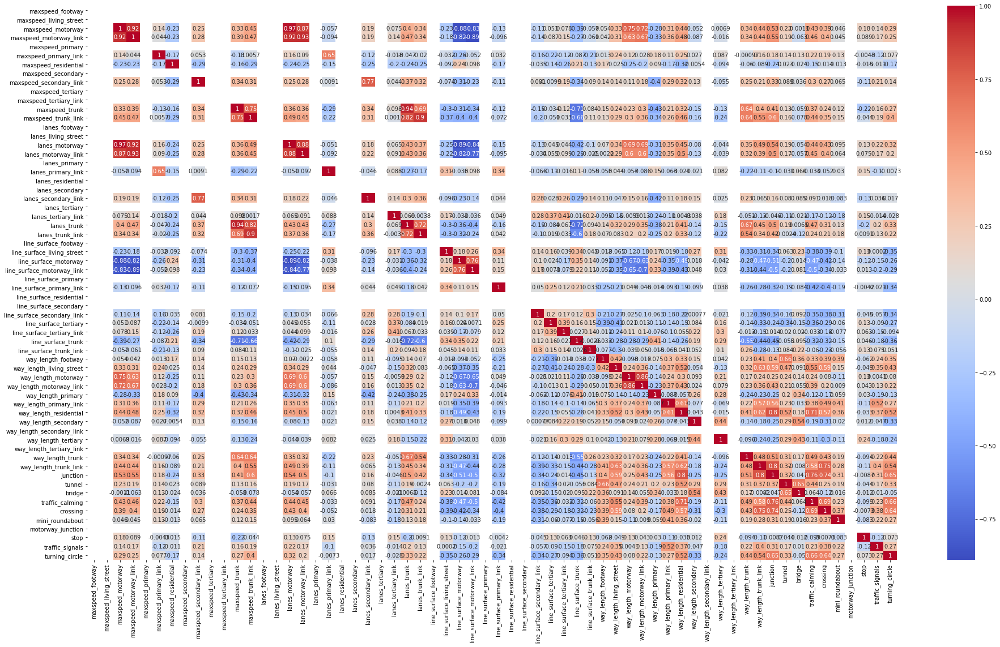

In [70]:
# Heatmap to understand the attributes dependency
plt.figure(figsize = (32,18))        
ax = sns.heatmap(cites_df_final.corr(),annot = True, cmap="coolwarm")

## Standarisation

**Méthode de z-score.**<br>
    (Xi - moyen) / écart-type

In [71]:
df_scaled = StandardScaler().fit_transform(cites_df_final)

In [72]:
df_scaled


array([[ 0.        ,  0.        ,  1.14340545, ...,  0.50685088,
        -1.50548474,  2.14645458],
       [ 0.        ,  0.        , -0.92298994, ...,  0.356895  ,
         0.36786654,  0.43789698],
       [ 0.        ,  0.        , -0.92298994, ..., -0.24292853,
        -1.47752427, -0.89098114],
       ...,
       [ 0.        ,  0.        ,  1.14340545, ..., -1.89244323,
         0.36786654, -0.51130168],
       [ 0.        ,  0.        ,  1.14340545, ...,  0.50685088,
        -0.97423587,  0.34297712],
       [ 0.        ,  0.        ,  1.14340545, ...,  0.50685088,
         0.17214327,  1.29217578]])

## ACP

Réduction de dimensionnalité.

In [73]:
df_pca = PCA(svd_solver='randomized', random_state=42).fit(df_scaled)

Calcul de la somme cummulé des variances exprimés par les features afin de détecter le nombre de composants qui expriment le plus part d'information.

Text(0, 0.5, 'Variance Ratio')

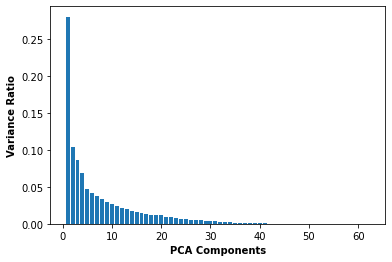

In [74]:
# Variance Ratio bar plot for each PCA components.

ax = plt.bar(range(1,len(df_pca.explained_variance_ratio_)+1), df_pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

In [75]:
cumsum_variance = np.cumsum(df_pca.explained_variance_ratio_)

In [76]:
px.line(cumsum_variance)

In [77]:
# percent_components = 0
nb_components = 0
for i in cumsum_variance:
    if i < 0.9:
        nb_components +=1
print(nb_components)

18


In [78]:
df_pca = PCA(n_components=nb_components).fit_transform(cites_df_final)

## KMeans

##### Détection de la meilleur valeur d'hyper-parametre K

**inertie = somme carré des distances entre les observations**

* On sauvegarde les models correpondants aux différents valeurs de K pour ne pas les calculer à nouveau lors après le choix de K optimale.

In [79]:
nb_clusters = range(2, int(df_pca.shape[0]/2+2))
inertie = []
models = []
for K in nb_clusters:
  kmeans = KMeans(K)
  kmeans.fit(df_pca)
  models.append(kmeans)
  inertie.append(kmeans.inertia_)

##### Elbow plot.

In [80]:
px.line(
    x = nb_clusters,
    y = inertie,
    labels = {
        "x": "nombre de clusters (K)",
        "y": "inertie"
    }
)

Détection numérique de 'Elbow point' avec la fonction KneeLocator du package 'kneed'.

In [81]:
kl = KneeLocator(nb_clusters, inertie, S=1.0, curve='convex', direction='decreasing')
K = kl.elbow
print(f'La valeur optimale de K est {K}.')

La valeur optimale de K est 9.


In [82]:
kmeans = models[K]

In [83]:
kmeans.cluster_centers_

array([[-4.21863288e+02, -8.56779672e+01,  2.60618582e+02,
         2.75314670e+01,  2.25959496e+01,  1.35254528e+01,
        -2.36724521e+01, -1.51194010e+01, -1.09906173e+01,
         4.32766336e+00,  5.61112588e+00, -4.11658510e+00,
         1.11974348e+01, -1.04118805e+00,  3.26057969e+00,
         9.20428747e+00,  3.53549485e+00,  2.00058928e+00],
       [ 2.03378608e+02,  3.76266165e+02, -7.88802256e+01,
         6.70762087e+01,  5.63321555e+01,  2.18142144e+01,
         2.91252525e+01,  2.36500621e+01, -1.65955146e+01,
        -3.26998874e+01,  3.66524195e+00,  2.38289130e+01,
         2.44989931e+00, -5.30035891e+00, -1.95429997e+00,
         3.90468486e+00, -7.59862508e+00, -1.20299212e+00],
       [ 5.13511926e+01, -6.57236823e+02, -1.08618861e+00,
         1.01472169e+01, -2.41208947e+01, -1.23063345e+01,
        -6.52586123e+00,  9.59197694e+00,  1.00166489e+01,
         9.78227862e+00,  2.30160936e-01, -5.74290499e+00,
        -9.53643428e+00,  8.03212803e+00,  3.41924520e

In [84]:
classes_kmeans = kmeans.labels_
classes_kmeans,len(classes_kmeans)

(array([10,  9,  0,  6,  9,  6,  9,  1,  5,  2,  9,  2,  2,  2,  8,  0,  2,
         2,  9,  9,  8,  2,  0,  5, 10, 10, 10, 10,  3,  2,  1,  3,  6,  2,
         0,  9, 10, 10,  2,  0,  3,  5,  5,  9,  0,  4,  1,  6,  3,  8,  5,
         5,  9,  1,  6,  9,  9,  7,  5,  4,  6,  3,  4,  3, 10, 10,  5,  8,
         6,  5,  7,  2,  6, 10,  3]),
 75)

## CAH

##### Dendrogram

* Le K est le nombre des lignes verticales qui traversent la coupe horizontale correspondant au plus grand saut entre deux clusters consécutifs.

* Ward's Linkage Method. Instead of measuring the distance directly, it analyzes the variance of clusters. Ward's is said to be the most suitable method for quantitative variables.

In [85]:
ff.create_dendrogram(
    df_pca,
    linkagefun = lambda x: linkage(x, "ward")
)

In [86]:
cah = AgglomerativeClustering(n_clusters = 5).fit(df_pca)

In [87]:
classes_cah = cah.labels_
classes_cah

array([3, 1, 0, 1, 1, 3, 1, 4, 4, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1,
       0, 0, 3, 3, 3, 3, 2, 1, 3, 2, 1, 1, 1, 1, 3, 3, 1, 1, 2, 0, 0, 1,
       0, 0, 4, 1, 2, 0, 4, 4, 1, 4, 1, 1, 1, 4, 4, 0, 1, 2, 0, 3, 3, 3,
       0, 0, 1, 0, 4, 1, 1, 3, 2], dtype=int64)

### KMedoids

In [88]:
from sklearn_extra.cluster import KMedoids

In [89]:
nb_clusters_kmedoids = range(2, int(df_pca.shape[0]/2+2))
inertie_kmedoids = []
models_kmedoids = []
for K in nb_clusters_kmedoids:
  kmedoids = KMedoids(K)
  kmedoids.fit(df_pca)
  models_kmedoids.append(kmedoids)
  inertie_kmedoids.append(kmedoids.inertia_)

In [90]:
px.line(
    x = nb_clusters_kmedoids,
    y = inertie_kmedoids,
    labels = {
        "x": "nombre de clusters (K)",
        "y": "inertie"
    }
)

In [91]:
kl_KMedoids = KneeLocator(nb_clusters_kmedoids, inertie_kmedoids, S=1.0, curve='convex', direction='decreasing')
K = kl_KMedoids.elbow
print(f'La valeur optimale de K est {K}.')

La valeur optimale de K est 13.


In [92]:
kmedoids = models_kmedoids[K]

In [93]:
kmedoids.labels_

array([13,  4, 10, 14,  4, 11,  6,  9, 11,  1,  4,  1,  7,  6, 10,  3,  7,
        1,  6,  0, 10,  6, 10,  8, 13, 13, 13, 13,  5,  6,  9,  5, 12,  7,
        2,  0, 13, 13,  7,  2,  5,  8,  8,  2, 10, 10,  9, 11,  5,  8,  8,
        9,  2,  9, 14, 12,  3,  9,  9,  8, 11,  5,  8,  5, 13, 13,  8,  8,
       14,  8,  9,  1, 11, 13,  5], dtype=int64)

## Comparaison entre KMeans et CAH

* On ne peut pas évaluer nos models puisqu'on n'a pas des classes (labels) réels pour notre données.
    * Donc Il faut comparer le coefficient silhouette des deux clusters générés par les deux models.
        * The silhouette method computes silhouette coefficients of each point that measure how much a point is similar to its own cluster compared to other clusters.

**Le coefficient silhouette de CAH.**

In [94]:
silhouette_cah = silhouette_score(df_pca, classes_cah)

**Le coefficient silhouette de KMeans.**

In [95]:
silhouette_kmeans = silhouette_score(df_pca, kmeans.labels_)

**Le coefficient silhouette de KMedoids.**

In [96]:
silhouette_kmedoids = silhouette_score(df_pca, kmedoids.labels_)

In [97]:
models_dict = {"cah":silhouette_cah,"kmeans":silhouette_kmeans,"kmedoids":silhouette_kmedoids}
max(models_dict, key=models_dict.get )

'cah'

Le coefficient de la méthode CAH est plus grand que celui de Kmeans.

On va utiliser le CAH pour le regroupement des communes.

In [98]:
cites = pd.DataFrame(
    {
      'city_name': cites_df["city_name_x"],
      'city_population' : cites_df["city_population"],
      'classe': cah.labels_,
      'city_geom': cites_df["city_geom"]
    }
)

In [99]:
cites

,city_name,city_population,classe,city_geom
0,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,209897,3,(POLYGON ((-607808.4606287895 4269639.47792258...
1,Province de Sidi Ifni ⵜⴰⵙⴳⴰ ⵏ ⵙⵉⴷⵉ ⵉⴼⵏⵉ إقليم ...,115691,1,POLYGON ((-1159956.763978826 3392437.675377367...
2,Province de Midelt إقليم ميدلت,289337,0,POLYGON ((-655469.0545837996 3761134.047439184...
3,Province de Tinghir إقليم تنغير,322412,1,POLYGON ((-717693.5886512427 3704559.448839383...
4,Province de Rhamna إقليم الرحامنة,315077,1,POLYGON ((-944060.1033870025 3806528.031945176...
...,...,...,...,...
70,Province de Kenitra إقليم القنيطرة,1061435,4,"POLYGON ((-749270.38635407 4050130.602123051, ..."
71,Province de Chefchaouen ⵜⵛⴻⴼⵜⵛⴰⵡⴻⵏ إقليم شفشاون,457432,1,(POLYGON ((-617457.444847616 4192205.456661489...
72,Province de Larache إقليم العرائش,496687,1,POLYGON ((-695049.1670772093 4164081.633201412...
73,Province de Tétouan إقليم تطوان,550374,3,POLYGON ((-650366.3695009192 4225759.241735836...


10 ville qui ont des caractéristiques communs et qui appartient au 3eme groupement.

In [100]:
cites[cites['classe'] == 2]['city_name'].tolist()[:10]

['Préfecture de Casablanca عمالة الدار البيضاء',
 "Préfecture d'Oujda-Angad عمالة وجدة - أنجاد",
 'Province de Nador إقليم الناظور',
 'Préfecture de Marrakech عمالة مراكش',
 'Préfecture de Fès عمالة فاس',
 'Préfecture de Tanger-Assilah عمالة طنجة-أصيلة']

## Visualisation

In [101]:
my_geo_df = gpd.GeoDataFrame(cites, geometry='city_geom', crs="epsg:3857")
my_geo_df.head(3)


,city_name,city_population,classe,city_geom
0,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,209897,3,"MULTIPOLYGON (((-607808.461 4269639.478, -6074..."
1,Province de Sidi Ifni ⵜⴰⵙⴳⴰ ⵏ ⵙⵉⴷⵉ ⵉⴼⵏⵉ إقليم ...,115691,1,"POLYGON ((-1159956.764 3392437.675, -1159867.2..."
2,Province de Midelt إقليم ميدلت,289337,0,"POLYGON ((-655469.055 3761134.047, -648533.349..."


In [102]:
my_geo_df = my_geo_df.to_crs(epsg=4326)


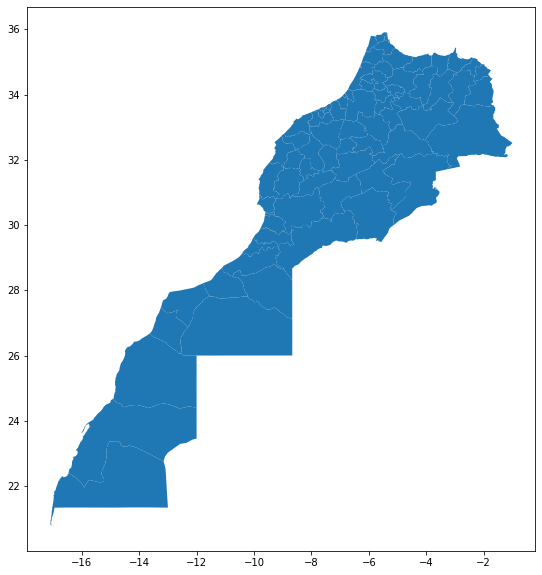

In [103]:
my_geo_df.plot(figsize=(15, 10))
plt.show()

In [104]:
fig = my_geo_df.explore(
     column="classe", # make choropleth based on "BoroName" column
     tooltip=["city_name", "classe"], # show "BoroName" value in tooltip (on hover)
     popup=True, # show all values in popup (on click)
     tiles="CartoDB positron", # use "CartoDB positron" tiles
     cmap="Set1", # use "Set1" matplotlib colormap
     style_kwds=dict(color="black") # use black outline
)

In [105]:
fig

In [106]:
my_geo_df

,city_name,city_population,classe,city_geom
0,Préfecture de M'diq-Fnideq عمالة المضيق الفنيدق,209897,3,"MULTIPOLYGON (((-5.46004 35.77452, -5.45643 35..."
1,Province de Sidi Ifni ⵜⴰⵙⴳⴰ ⵏ ⵙⵉⴷⵉ ⵉⴼⵏⵉ إقليم ...,115691,1,"POLYGON ((-10.42007 29.13184, -10.41926 29.132..."
2,Province de Midelt إقليم ميدلت,289337,0,"POLYGON ((-5.88818 31.98342, -5.82587 31.96374..."
3,Province de Tinghir إقليم تنغير,322412,1,"POLYGON ((-6.44715 31.55134, -6.44513 31.54877..."
4,Province de Rhamna إقليم الرحامنة,315077,1,"POLYGON ((-8.48064 32.32864, -8.47792 32.32324..."
...,...,...,...,...
70,Province de Kenitra إقليم القنيطرة,1061435,4,"POLYGON ((-6.73081 34.15869, -6.70136 34.14440..."
71,Province de Chefchaouen ⵜⵛⴻⴼⵜⵛⴰⵡⴻⵏ إقليم شفشاون,457432,1,"MULTIPOLYGON (((-5.54671 35.20816, -5.53933 35..."
72,Province de Larache إقليم العرائش,496687,1,"POLYGON ((-6.24373 35.00148, -6.23397 34.99872..."
73,Province de Tétouan إقليم تطوان,550374,3,"POLYGON ((-5.84234 35.45406, -5.82074 35.46685..."


In [118]:
df_clusters = my_geo_df.copy()

In [130]:
df_clusters.groupby(["classe"])[["city_name"]].count().reset_index()

,classe,city_name
0,0,16
1,1,31
2,2,6
3,3,13
4,4,9


In [121]:
df_clusters.city_name = df_clusters.city_name.str.replace("Province de", "").str.replace("Préfecture de", "").str.replace("Prefecture de", "").str.replace("Province d'", "").str.replace("Préfecture d'", "").str.replace("إقليم", "").str.replace("عمالة", "")

In [ ]:
import plotly.express as px 

In [148]:
fig  = px.sunburst(df_clusters, path=['classe', 'city_name'] , values='city_population')

fig.update_layout(margin=dict(t=15,l=0,r=0,b=15))
# fig.update_layout(plot_bgcolor= "rgba(0,0,0,0)") 
  
fig.show()

In [149]:
fig.show()

In [168]:
import json

In [170]:
fig = px.choropleth_mapbox(my_geo_df, 
                           geojson=json.loads(my_geo_df.city_geom.to_json()),
                           locations='city_name',
                           color='classe',
                           color_continuous_scale="Viridis",
                           mapbox_style="open-street-map",
                           height=640,
                           zoom=3,
                           center = {"lat": 31.628674, "lon": -7.992047},
                           opacity=1,
                          )
fig.update_geos(fitbounds="locations", visible=True)
fig.update_layout(
    margin={"r":0,"t":0,"l":0,"b":0},
    coloraxis_colorbar={
        'title':'Sum'})
fig.show()